Root Mean Squared Error: 507.53
R2 Score: 0.72


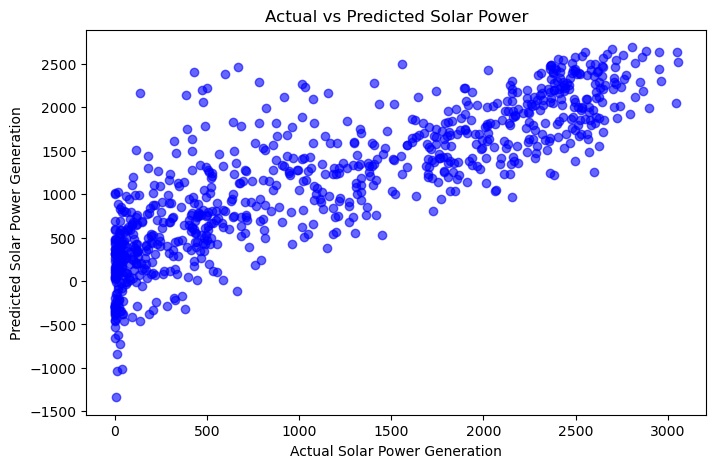

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Load Dataset
df = pd.read_csv("solarpowergeneration.csv")

# Splitting features (X) and target variable (y)
X = df.iloc[:, :-1].values  # All columns except last one
y = df.iloc[:, -1].values  # Last column (solar power generation)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Feature Scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


# Choose a Machine Learning Model (Linear Regression or Decision Tree)
model = LinearRegression()  # Try DecisionTreeRegressor() as well
# model = DecisionTreeRegressor()

# Train the model
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Model Evaluation
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R2 Score: {r2:.2f}")

# Plot Predictions vs Actual Values
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred, color="blue", alpha=0.6)
plt.xlabel("Actual Solar Power Generation")
plt.ylabel("Predicted Solar Power Generation")
plt.title("Actual vs Predicted Solar Power")
plt.show()

In [18]:
df.head(1)

,temperature_2_m_above_gnd,relative_humidity_2_m_above_gnd,mean_sea_level_pressure_MSL,total_precipitation_sfc,snowfall_amount_sfc,total_cloud_cover_sfc,high_cloud_cover_high_cld_lay,medium_cloud_cover_mid_cld_lay,low_cloud_cover_low_cld_lay,shortwave_radiation_backwards_sfc,...,wind_direction_10_m_above_gnd,wind_speed_80_m_above_gnd,wind_direction_80_m_above_gnd,wind_speed_900_mb,wind_direction_900_mb,wind_gust_10_m_above_gnd,angle_of_incidence,zenith,azimuth,generated_power_kw
0,2.17,31,1035.0,0.0,0.0,0.0,0,0,0,0.0,...,312.71,9.36,22.62,6.62,337.62,24.48,58.753108,83.237322,128.33543,454.10095


In [ ]:
sns.pairplot(df)

<IPython.core.display.Javascript object>

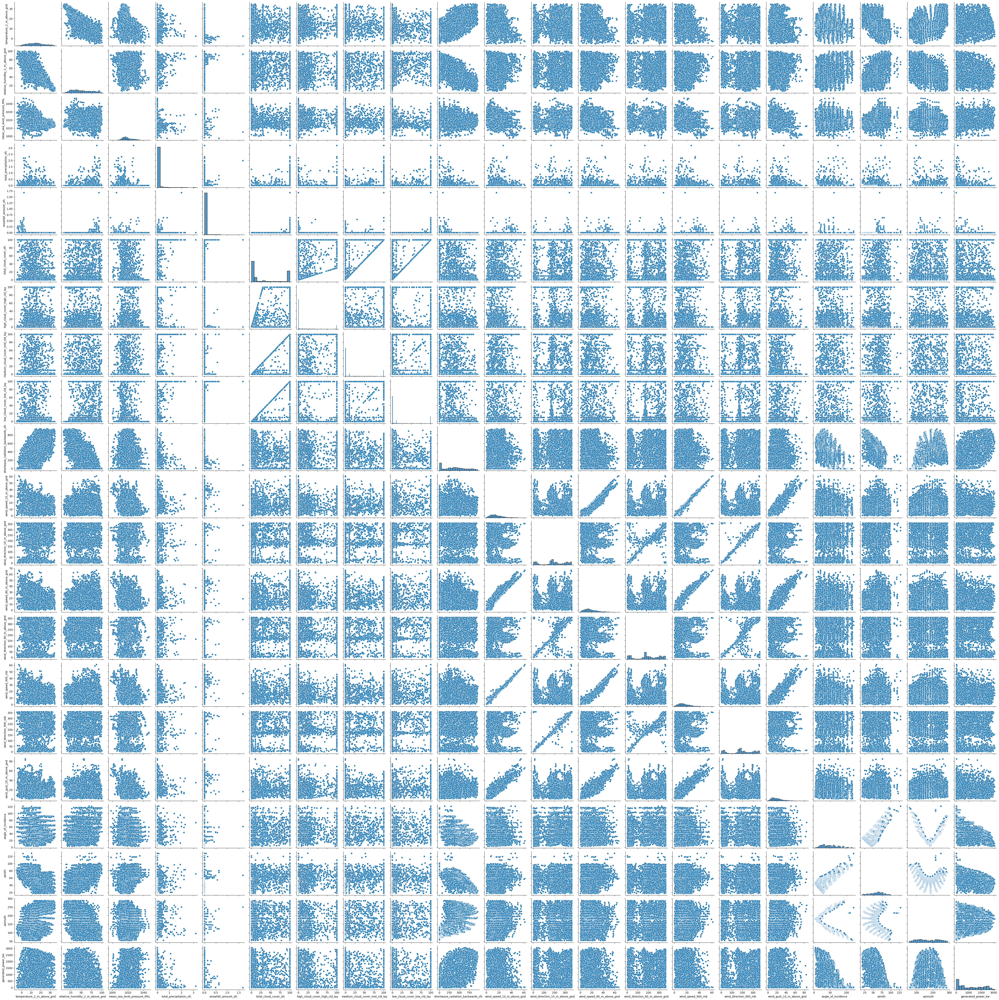

In [ ]:
import seaborn as sns


# Save the plot to the results folder
sns.pairplot(df).savefig("results/pair_plot.png")

In [ ]:
# Save the model to the results folder
import joblib

joblib.dump(model, "results/model.pkl")

['results/model.pkl']

In [ ]:
import os

# Create directory if it does not exist
os.makedirs("model_results", exist_ok=True)

RFModel = RandomForestRegressor()
RFModel.fit(X_train, y_train)
y_pred = RFModel.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R2 Score: {r2:.2f}")
joblib.dump(RFModel, "model_results/RFModel.pkl")

<IPython.core.display.Javascript object>

Root Mean Squared Error: 406.11
R2 Score: 0.82


['model_results/RFModel.pkl']